<a href="https://colab.research.google.com/github/iopara268/MasterProject/blob/main/FAKE_FACE_DETECTION_FINAL_WITH_HYBRID_MODEL_OF_CNN_AND_TRANSFORMER_BLOCK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


PATH TO THE DIRECTORIES

In [2]:
base_dir = '/content/drive/MyDrive/realvsfake1'
train_dir = f'{base_dir}/rvf10k/train'
valid_dir = f'{base_dir}/rvf10k/valid'

IMPORT THE LIBRARIES

In [13]:
import os
import random
import matplotlib.image as mpimg
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing import image

NUMBER COUNT OF THE SUBDIRECTORIES

In [4]:
def count_directory_contents(dir_path):
    if os.path.exists(dir_path):
        dir_count = 0
        file_count = 0
        for root, dirs, files in os.walk(dir_path):
            dir_count += len(dirs)
            file_count += len(files)
        return dir_count, file_count
    else:
        return None, None


base_dir_counts = count_directory_contents(base_dir)
train_dir_counts = count_directory_contents(train_dir)
valid_dir_counts = count_directory_contents(valid_dir)


print(f"Base Directory: {base_dir} -> Directories: {base_dir_counts[0]}, Files: {base_dir_counts[1]}")
print(f"Training Directory: {train_dir} -> Directories: {train_dir_counts[0]}, Files: {train_dir_counts[1]}")
print(f"Validation Directory: {valid_dir} -> Directories: {valid_dir_counts[0]}, Files: {valid_dir_counts[1]}")


Base Directory: /content/drive/MyDrive/realvsfake1 -> Directories: 13, Files: 10307
Training Directory: /content/drive/MyDrive/realvsfake1/rvf10k/train -> Directories: 2, Files: 7000
Validation Directory: /content/drive/MyDrive/realvsfake1/rvf10k/valid -> Directories: 2, Files: 3000


VIEWING 10 RANDOM IMAGES IN THE SUBDIRECTORIES

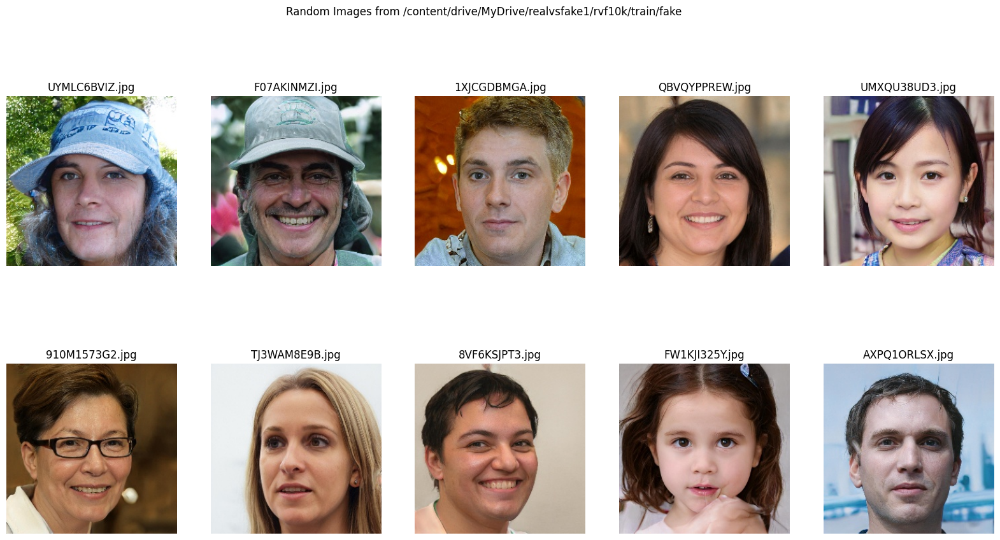

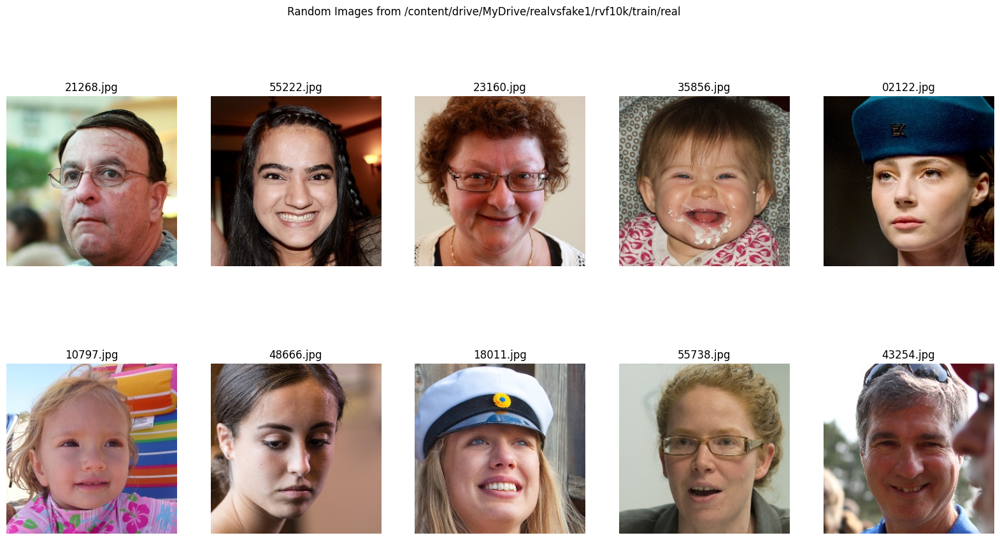

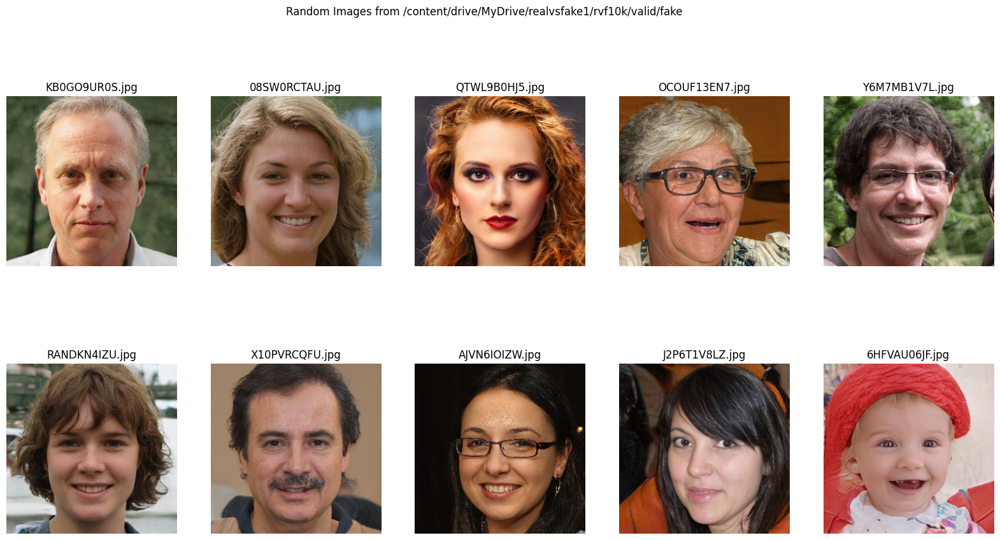

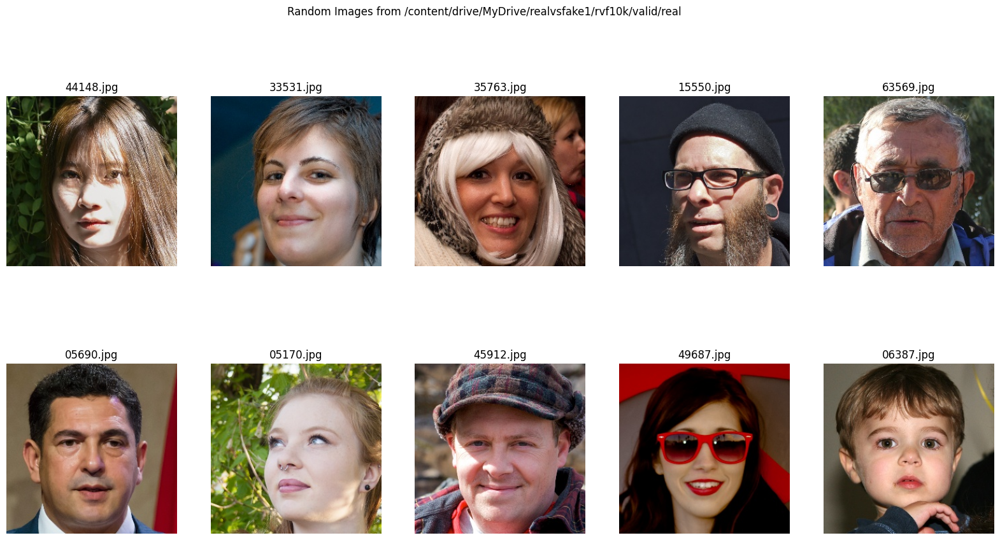

In [5]:
def display_random_images(base_dir, num_images=10):
    for root, dirs, files in os.walk(base_dir):
        for subdir in dirs:
            subdir_path = os.path.join(root, subdir)
            images = [os.path.join(subdir_path, file) for file in os.listdir(subdir_path) if file.lower().endswith(('png', 'jpg', 'jpeg', 'gif', 'bmp'))]
            if len(images) > 0:
                random_images = random.sample(images, min(len(images), num_images))
                plt.figure(figsize=(20, 10))
                for i, img_path in enumerate(random_images):
                    img = mpimg.imread(img_path)
                    plt.subplot(2, 5, i + 1)
                    plt.imshow(img)
                    plt.axis('off')
                    plt.title(os.path.basename(img_path))
                plt.suptitle(f'Random Images from {subdir_path}')
                plt.show()

display_random_images(train_dir)
display_random_images(valid_dir)


DATA PREPROCESSING

In [5]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


valid_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary'
)

valid_generator = valid_datagen.flow_from_directory(
    valid_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary'
)


Found 7000 images belonging to 2 classes.
Found 3000 images belonging to 2 classes.


PARAMETERS USED

In [7]:
def print_parameters(batch_size, img_height, img_width, epochs, class_mode):
    print(f"Batch size: {batch_size}")
    print(f"Image height: {img_height}")
    print(f"Image width: {img_width}")
    print(f"Epochs: {epochs}")
    print(f"Class mode: {class_mode}")


batch_size = 32
img_height = 128
img_width = 128
epochs = 100
class_mode = 'binary'

print_parameters(batch_size, img_height, img_width, epochs, class_mode)

Batch size: 32
Image height: 128
Image width: 128
Epochs: 100
Class mode: binary


BUILDING THE CNN MODEL

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


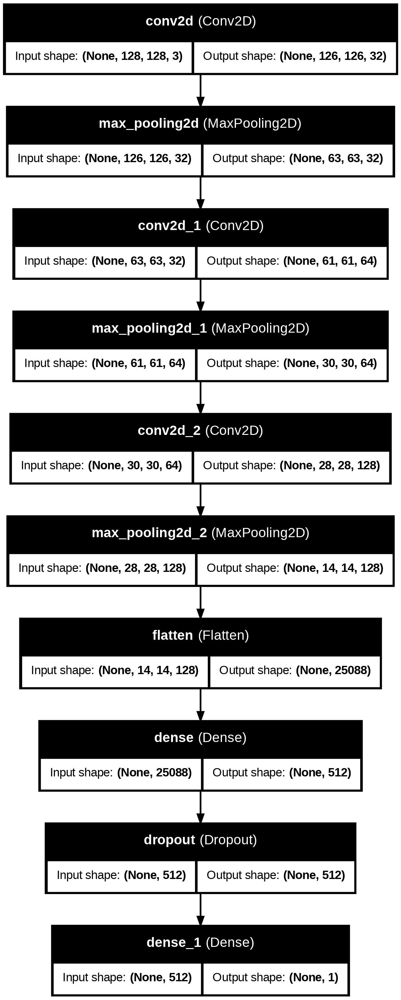

In [6]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
plot_model(model, to_file='cnn_model_plot.png', show_shapes=True, show_layer_names=True)


CALL BACK AND EARLY STOPPING

In [7]:
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

TRAINING

In [8]:
history = model.fit(
    train_generator,
    epochs=100,
    validation_data=valid_generator,
    callbacks=[early_stopping, model_checkpoint]
)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


219/219 ━━━━━━━━━━━━━━━━━━━━ 6080s 27s/step - accuracy: 0.5180 - loss: 0.7517 - val_accuracy: 0.5397 - val_loss: 0.6918
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 69s 307ms/step - accuracy: 0.5221 - loss: 0.6931 - val_accuracy: 0.4987 - val_loss: 0.6927
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 69s 309ms/step - accuracy: 0.5216 - loss: 0.6921 - val_accuracy: 0.5587 - val_loss: 0.6834
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 69s 305ms/step - accuracy: 0.5295 - loss: 0.6918 - val_accuracy: 0.5460 - val_loss: 0.6851
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 69s 310ms/step - accuracy: 0.5552 - loss: 0.6858 - val_accuracy: 0.5733 - val_loss: 0.6799
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 70s 309ms/step - accuracy: 0.5716 - loss: 0.6815 - val_accuracy: 0.5863 - val_loss: 0.6730
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 69s 305ms/step - accuracy: 0.5801 - loss: 0.6778 - val_accuracy: 0.5833 - val_loss: 0.6733
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 82s 310ms/step - accuracy: 0.5712 - loss: 0.679

EVALUATING THE MODEL

In [9]:
valid_generator.reset()
test_loss, test_acc = model.evaluate(valid_generator)
y_true = valid_generator.classes
y_pred = (model.predict(valid_generator) > 0.5).astype('int32')
conf_mat = confusion_matrix(y_true, y_pred)
class_report = classification_report(y_true, y_pred)


94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.7461 - loss: 0.5464
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step


VISUALIZING THE RESULTS

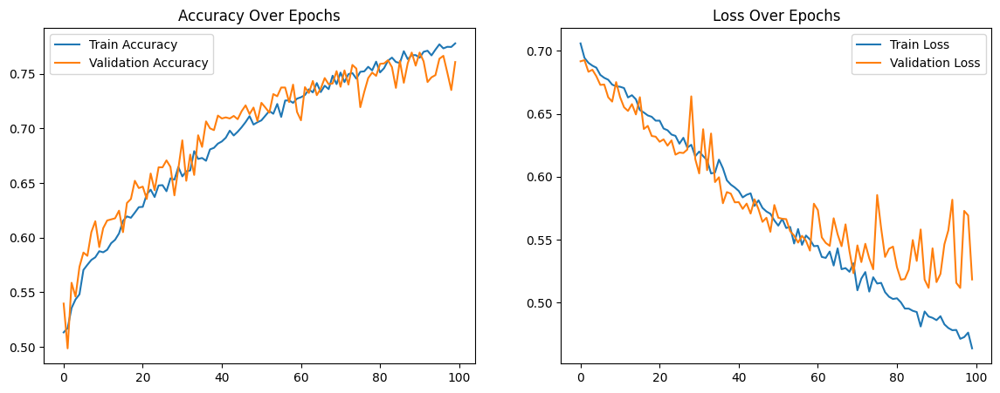

In [10]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Over Epochs')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Over Epochs')

plt.show()


CONFUSION MATRIX

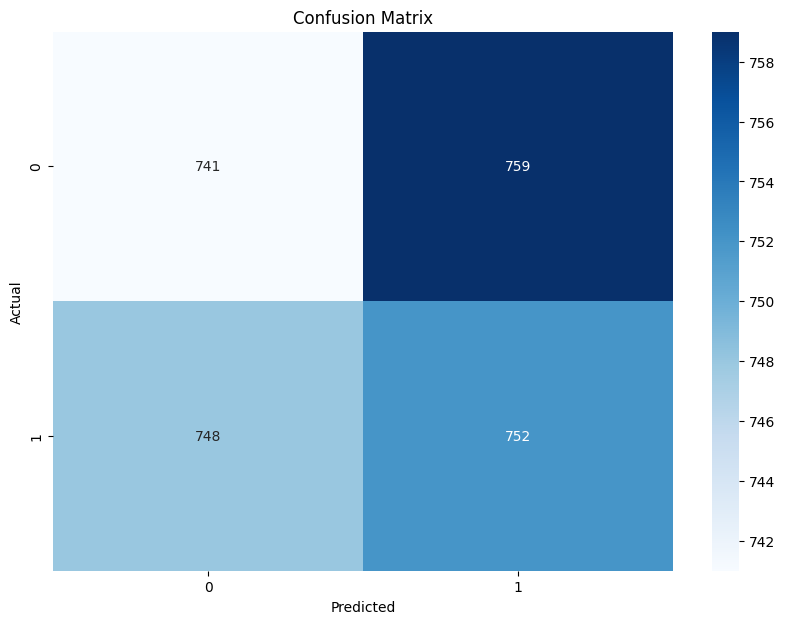

Test Accuracy: 0.7663333415985107
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.49      0.50      1500
           1       0.50      0.50      0.50      1500

    accuracy                           0.50      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.50      0.50      0.50      3000



In [11]:
plt.figure(figsize=(10, 7))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print(f'Test Accuracy: {test_acc}')
print('Classification Report:\n', class_report)

WILD TESTING 1

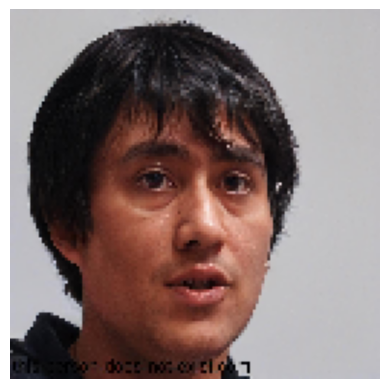

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
The model predicts: Fake


In [20]:
image_path = '/content/drive/MyDrive/image1.jpg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0


plt.imshow(img)

plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")


WILD TESTING 2

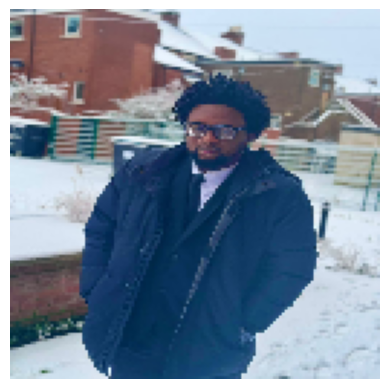

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
The model predicts: Real


In [21]:
image_path = '/content/drive/MyDrive/image2.jpg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0


plt.imshow(img)

plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")


WILD TESTING 3

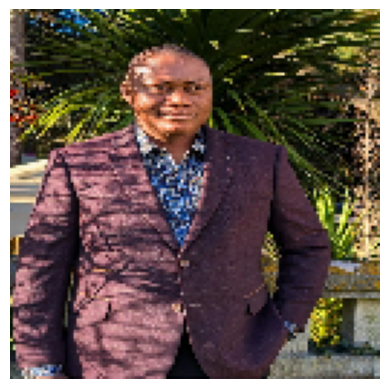

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
The model predicts: Fake


In [23]:
image_path = '/content/drive/MyDrive/image3.jpg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0


plt.imshow(img)

plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")


WILD TESTING 4

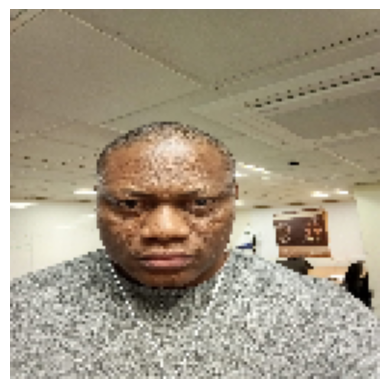

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
The model predicts: Real


In [24]:
image_path = '/content/drive/MyDrive/image4.jpeg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0


plt.imshow(img)

plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")


IMRPOVING THE MODEL

By reducing the dropout to prevent overfitting and allowing the model to learning more effectively

In [12]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])


model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])


early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')


history = model.fit(train_generator,
                    epochs=100,
                    validation_data=valid_generator,
                    callbacks=[early_stopping, model_checkpoint])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 79s 331ms/step - accuracy: 0.5034 - loss: 0.7035 - val_accuracy: 0.5050 - val_loss: 0.6895
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 70s 309ms/step - accuracy: 0.5310 - loss: 0.6892 - val_accuracy: 0.5880 - val_loss: 0.6752
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 69s 309ms/step - accuracy: 0.5647 - loss: 0.6821 - val_accuracy: 0.5733 - val_loss: 0.6704
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 82s 310ms/step - accuracy: 0.5911 - loss: 0.6705 - val_accuracy: 0.6220 - val_loss: 0.6632
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 70s 312ms/step - accuracy: 0.5956 - loss: 0.6676 - val_accuracy: 0.6163 - val_loss: 0.6569
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 80s 307ms/step - accuracy: 0.5988 - loss: 0.6656 - val_accuracy: 0.5870 - val_loss: 0.6688
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 81s 305ms/step - accuracy: 0.6158 - loss: 0.6566 - val_accuracy: 0.5677 - val_loss: 0.6861
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 70s 310ms/step - accuracy: 0.6171 -

EVALUATING THE MODEL

In [13]:
valid_generator.reset()
test_loss, test_acc = model.evaluate(valid_generator)
y_true = valid_generator.classes
y_pred = (model.predict(valid_generator) > 0.5).astype('int32')
conf_mat = confusion_matrix(y_true, y_pred)
class_report = classification_report(y_true, y_pred)

94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - accuracy: 0.7848 - loss: 0.4748
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step


VISUALIZING THE RESULTS

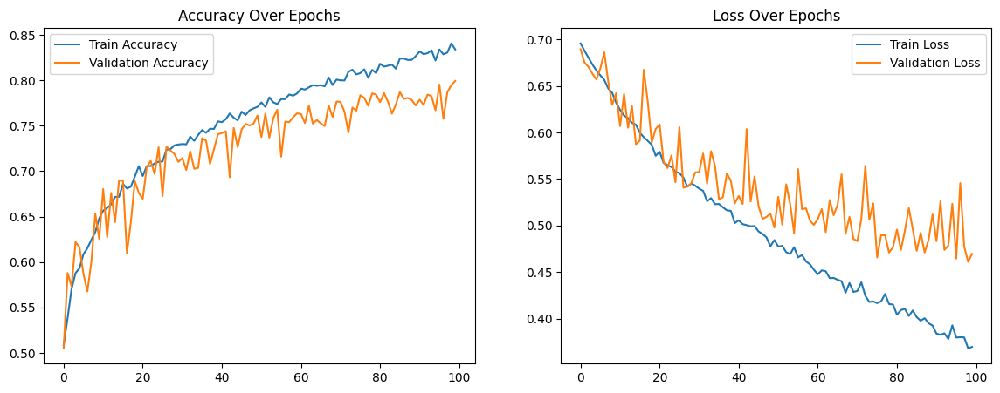

In [14]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Over Epochs')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Over Epochs')

plt.show()


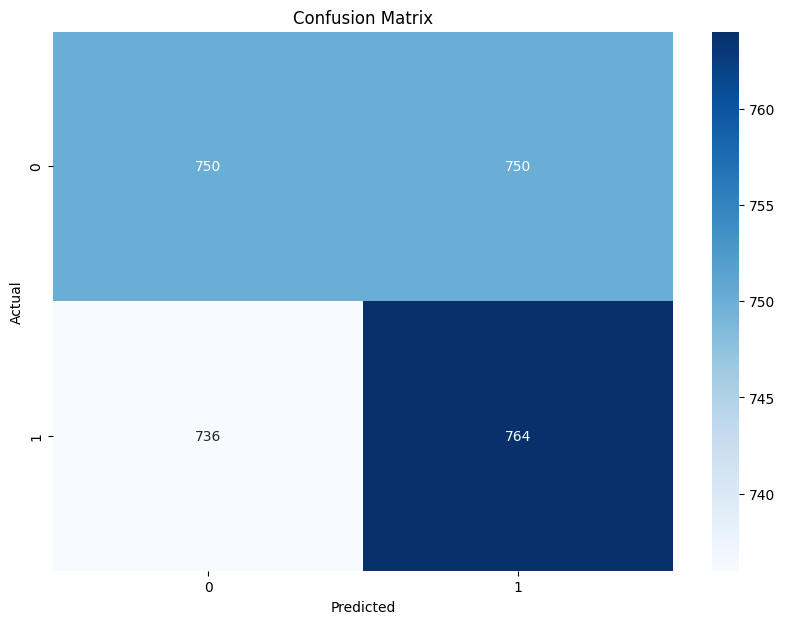

Test Accuracy: 0.7633333206176758
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.50      0.50      1500
           1       0.50      0.51      0.51      1500

    accuracy                           0.50      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.50      0.50      0.50      3000



In [26]:
plt.figure(figsize=(10, 7))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print(f'Test Accuracy: {test_acc}')
print('Classification Report:\n', class_report)

WILD TESTING 1

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


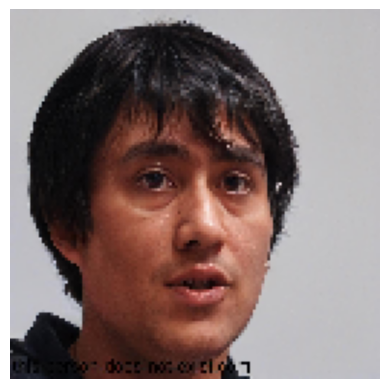

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The model predicts: Fake


In [16]:
image_path = '/content/drive/MyDrive/image1.jpg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0


plt.imshow(img)

plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")


WILD TESTING 2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


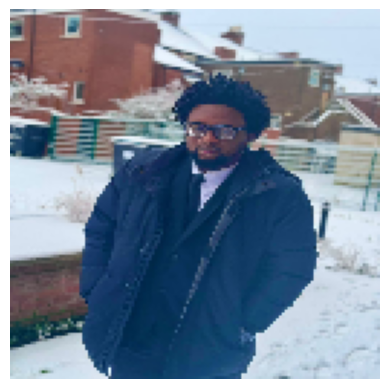

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The model predicts: Real


In [17]:
image_path = '/content/drive/MyDrive/image2.jpg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

plt.imshow(img)
plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")

WILD TESTING 3

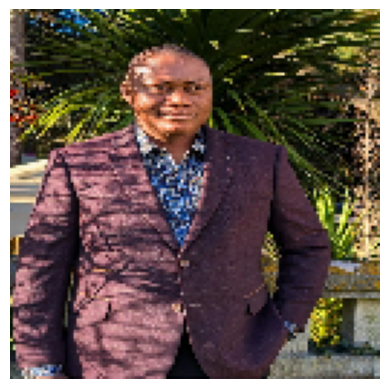

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
The model predicts: Fake


In [25]:
image_path = '/content/drive/MyDrive/image3.jpg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

plt.imshow(img)
plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")

WILD TESTING 4

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


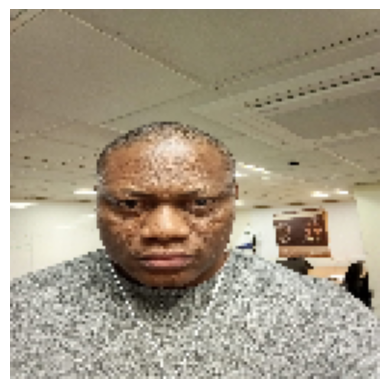

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
The model predicts: Real


In [19]:
image_path = '/content/drive/MyDrive/image4.jpeg'
img = image.load_img(image_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

plt.imshow(img)
plt.axis('off')
plt.show()

prediction = model.predict(img_array)

if prediction[0] > 0.5:
    print("The model predicts: Real")
else:
    print("The model predicts: Fake")

SAVE THE MODEL

In [21]:
save_dir = '/content/drive/MyDrive/path_to_save_model/'
model_name = 'model_name.keras'

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

model.save(os.path.join(save_dir, model_name))

CREATING THE HYBRID MODEL OF CNN AND TRANSFORMERBLOCK

In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, MultiHeadAttention, LayerNormalization, Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Reshape
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import mixed_precision
import os


In [4]:
# Enable mixed precision training
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)


In [5]:
# Define a simplified TransformerBlock class
class SimpleTransformerBlock(Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(SimpleTransformerBlock, self).__init__()
        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = Sequential([
            Dense(ff_dim, activation="relu"),
            Dense(embed_dim),
        ])
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)

    def call(self, inputs, training=False):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

In [6]:
# Define the CNN model with the simplified TransformerBlock
def create_cnn_transformer_model():
    inputs = tf.keras.layers.Input(shape=(128, 128, 3))
    x = Conv2D(32, (3, 3), activation='relu')(inputs)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Flatten()(x)

    # Add the simplified TransformerBlock after CNN layers
    x = Dense(128 * 64, activation='relu')(x)  # Adjusted dimensions
    x = Reshape((64, 128))(x)  # Adjust reshape dimensions
    x = SimpleTransformerBlock(embed_dim=128, num_heads=2, ff_dim=128, rate=0.2)(x)
    x = Flatten()(x)

    # Fully connected layers
    x = Dense(256, activation='relu')(x)  # Reduced from 512 to 256
    x = Dropout(0.3)(x)
    outputs = Dense(1, activation='sigmoid')(x)

    model = Model(inputs, outputs)
    return model

In [7]:
# Create the model
model = create_cnn_transformer_model()

# Compile the model with a reduced learning rate
model.compile(optimizer=Adam(learning_rate=0.00001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [8]:
# Data preprocessing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/realvsfake1/rvf10k/train',
    target_size=(128, 128),
    batch_size=16,  # Reduced batch size
    class_mode='binary'
)

valid_generator = valid_datagen.flow_from_directory(
    '/content/drive/MyDrive/realvsfake1/rvf10k/valid',
    target_size=(128, 128),
    batch_size=16,  # Reduced batch size
    class_mode='binary'
)


Found 7000 images belonging to 2 classes.
Found 3000 images belonging to 2 classes.


In [9]:
# Implement learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1)

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/best_model.keras', save_best_only=True, monitor='val_loss')


In [10]:
# Train the model
history = model.fit(train_generator,
                    epochs=100,
                    validation_data=valid_generator,
                    callbacks=[early_stopping, model_checkpoint])


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


438/438 ━━━━━━━━━━━━━━━━━━━━ 296s 542ms/step - accuracy: 0.5001 - loss: 1.0286 - val_accuracy: 0.5457 - val_loss: 0.6907
Epoch 2/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 97s 216ms/step - accuracy: 0.5124 - loss: 0.6962 - val_accuracy: 0.5470 - val_loss: 0.6913
Epoch 3/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 97s 220ms/step - accuracy: 0.5142 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6963
Epoch 4/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 238s 543ms/step - accuracy: 0.5144 - loss: 0.6938 - val_accuracy: 0.5693 - val_loss: 0.6874
Epoch 5/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 236s 537ms/step - accuracy: 0.5157 - loss: 0.6936 - val_accuracy: 0.5900 - val_loss: 0.6862
Epoch 6/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 374s 851ms/step - accuracy: 0.5441 - loss: 0.6896 - val_accuracy: 0.5470 - val_loss: 0.6844
Epoch 7/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 277s 629ms/step - accuracy: 0.5393 - loss: 0.6901 - val_accuracy: 0.5820 - val_loss: 0.6818
Epoch 8/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 145s 225ms/step - accuracy: 0.5414 - loss:

188/188 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.7633 - loss: 0.4940
188/188 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step


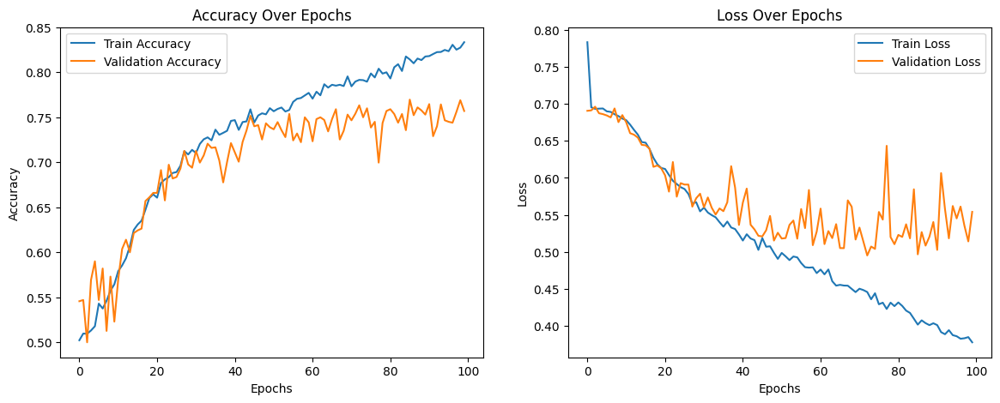

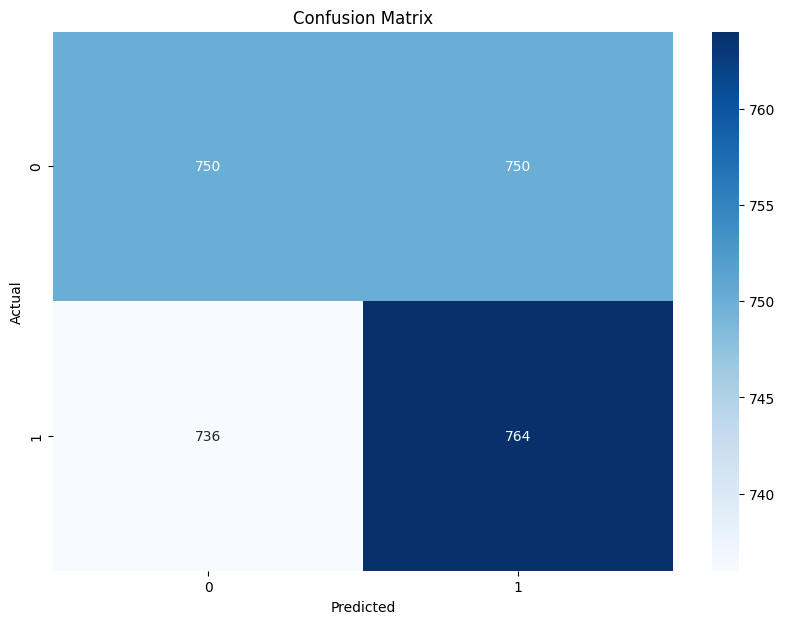

Test Accuracy: 0.7633333206176758
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.50      0.50      1500
           1       0.50      0.51      0.51      1500

    accuracy                           0.50      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.50      0.50      0.50      3000



In [11]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Evaluate the model
valid_generator.reset()
test_loss, test_acc = model.evaluate(valid_generator)
y_true = valid_generator.classes
y_pred = (model.predict(valid_generator) > 0.5).astype('int32')

# Generate confusion matrix and classification report
conf_mat = confusion_matrix(y_true, y_pred)
class_report = classification_report(y_true, y_pred)

# Visualization
plt.figure(figsize=(14, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy Over Epochs')

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Over Epochs')

plt.show()

# Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print(f'Test Accuracy: {test_acc}')
print('Classification Report:\n', class_report)

WILD TESTING 1

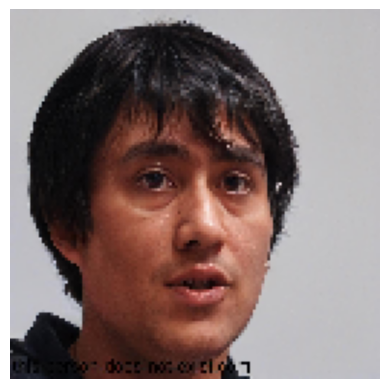

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
The model predicts: Fake


In [14]:
# Load and preprocess the image
def load_and_preprocess_image(image_path, target_size=(128, 128)):
    img = image.load_img(image_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img, img_array

# Visualize the image
def visualize_image(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Make a prediction using the trained model
def predict_image(model, img_array):
    prediction = model.predict(img_array)
    if prediction[0] > 0.5:
        return "The model predicts: Real"
    else:
        return "The model predicts: Fake"

# Define the image path
image_path = '/content/drive/MyDrive/image1.jpg'

# Load and preprocess the image
img, img_array = load_and_preprocess_image(image_path)

# Visualize the image
visualize_image(img)

# Make a prediction
result = predict_image(model, img_array)
print(result)


WILD TESTING 2

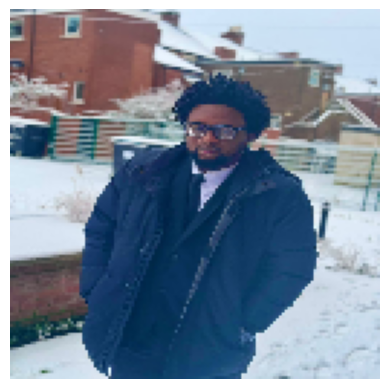

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
The model predicts: Real


In [15]:
# Load and preprocess the image
def load_and_preprocess_image(image_path, target_size=(128, 128)):
    img = image.load_img(image_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img, img_array

# Visualize the image
def visualize_image(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Make a prediction using the trained model
def predict_image(model, img_array):
    prediction = model.predict(img_array)
    if prediction[0] > 0.5:
        return "The model predicts: Real"
    else:
        return "The model predicts: Fake"

# Define the image path
image_path = '/content/drive/MyDrive/image2.jpg'

# Load and preprocess the image
img, img_array = load_and_preprocess_image(image_path)

# Visualize the image
visualize_image(img)

# Make a prediction
result = predict_image(model, img_array)
print(result)


WILD TESTING 3

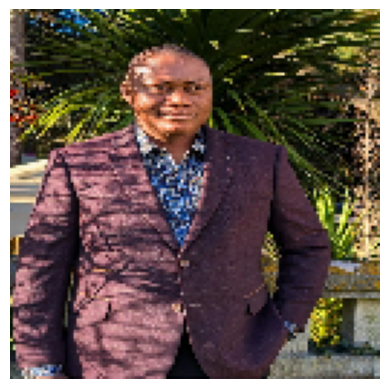

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The model predicts: Fake


In [17]:
# Load and preprocess the image
def load_and_preprocess_image(image_path, target_size=(128, 128)):
    img = image.load_img(image_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img, img_array

# Visualize the image
def visualize_image(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Make a prediction using the trained model
def predict_image(model, img_array):
    prediction = model.predict(img_array)
    if prediction[0] > 0.5:
        return "The model predicts: Real"
    else:
        return "The model predicts: Fake"

# Define the image path
image_path = '/content/drive/MyDrive/image3.jpg'

# Load and preprocess the image
img, img_array = load_and_preprocess_image(image_path)

# Visualize the image
visualize_image(img)

# Make a prediction
result = predict_image(model, img_array)
print(result)


WILD TESTING 4

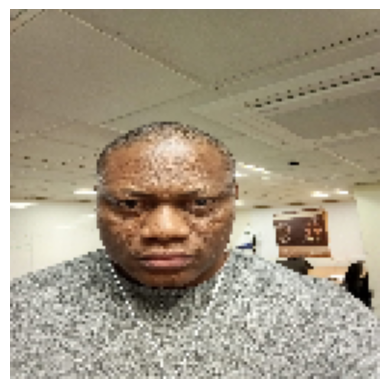

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
The model predicts: Real


In [19]:
# Load and preprocess the image
def load_and_preprocess_image(image_path, target_size=(128, 128)):
    img = image.load_img(image_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img, img_array

# Visualize the image
def visualize_image(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Make a prediction using the trained model
def predict_image(model, img_array):
    prediction = model.predict(img_array)
    if prediction[0] > 0.5:
        return "The model predicts: Real"
    else:
        return "The model predicts: Fake"

# Define the image path
image_path = '/content/drive/MyDrive/image4.jpeg'

# Load and preprocess the image
img, img_array = load_and_preprocess_image(image_path)

# Visualize the image
visualize_image(img)

# Make a prediction
result = predict_image(model, img_array)
print(result)
